# **Atividade 01 - Visão Computacional e Percepção**
Alunos:
- Glenda Proença Train
- Jhoser Alaff dos Santos Matheus

### Download das imagens (salvas em /content/trabalho-paralelo-master/img)

In [105]:
!wget https://gitlab.com/LucasBlockV/trabalho-paralelo/-/archive/master/trabalho-paralelo-master.zip
!unzip /content/trabalho-paralelo-master.zip

--2023-04-24 04:02:21--  https://gitlab.com/LucasBlockV/trabalho-paralelo/-/archive/master/trabalho-paralelo-master.zip
Resolving gitlab.com (gitlab.com)... 172.65.251.78, 2606:4700:90:0:f22e:fbec:5bed:a9b9
Connecting to gitlab.com (gitlab.com)|172.65.251.78|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [application/zip]
Saving to: ‘trabalho-paralelo-master.zip.2’

trabalho-paralelo-m     [        <=>         ]  29.19M  14.0MB/s    in 2.1s    

2023-04-24 04:02:23 (14.0 MB/s) - ‘trabalho-paralelo-master.zip.2’ saved [30605455]

Archive:  /content/trabalho-paralelo-master.zip
f36f7290a39bc95dc6e8d1a539a5828030fd5638
   creating: trabalho-paralelo-master/
 extracting: trabalho-paralelo-master/.gitignore  
  inflating: trabalho-paralelo-master/LICENSE  
  inflating: trabalho-paralelo-master/Makefile  
  inflating: trabalho-paralelo-master/README.md  
  inflating: trabalho-paralelo-master/canny.cpp  
  inflating: trabalho-paralelo-master/canny.cpp.ba

### Leitura das Imagens



- Definições iniciais (imports, constantes, variáveis e funções)

In [106]:
# Faz o import das libs principais
import cv2
import matplotlib.pyplot as plt
# ------------------------------------------------------------------------------

# Define a imagem de referência
image_path = "/content/trabalho-paralelo-master/img/dogemelancia.jpeg"
# ------------------------------------------------------------------------------

# Define a função de plot para 2 imagens
def plot_2_images(image_1, image_2, title_1, title_2, first_is_gray=False, second_is_gray=False):
  
  # Cria as configurações do plot
  plt.rcParams['figure.figsize'] = [8, 8]
  figure, axes = plt.subplots(1, 2)

  # Definições do plot da primeira imagem
  if(first_is_gray):
    axes[0].imshow(image_1, cmap=plt.cm.gray)
  else:
    axes[0].imshow(image_1)
  axes[0].axis('off')
  axes[0].set_title(title_1)

  # Definições do plot da segunda imagem
  if(second_is_gray):
    axes[1].imshow(image_2, cmap=plt.cm.gray)
  else:
    axes[1].imshow(image_2)
  axes[1].axis('off')
  axes[1].set_title(title_2)

  # Plota as duas imagens lado a lado
  plt.show()
# ------------------------------------------------------------------------------

- Conversão de BGR para RGB

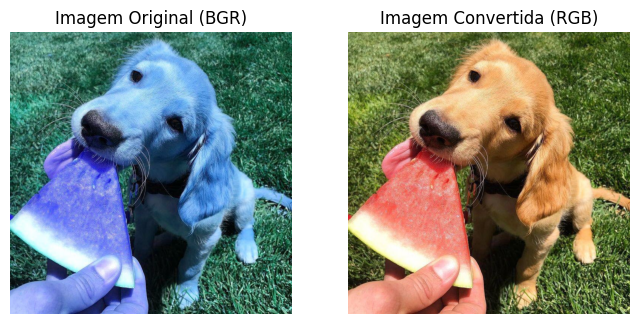

In [107]:
## Conversão de BGR para RGB

# Lê a imagem original
bgr_image = cv2.imread(image_path)

# Converte a imagem original em BGR para RGB
rgb_image = cv2.cvtColor(bgr_image, cv2.COLOR_BGR2RGB)

# Plota a imagem BGR x a imagem RGB
plot_2_images(bgr_image, rgb_image, "Imagem Original (BGR)", "Imagem Convertida (RGB)")

- Conversão de RGB para Escala de Cinza

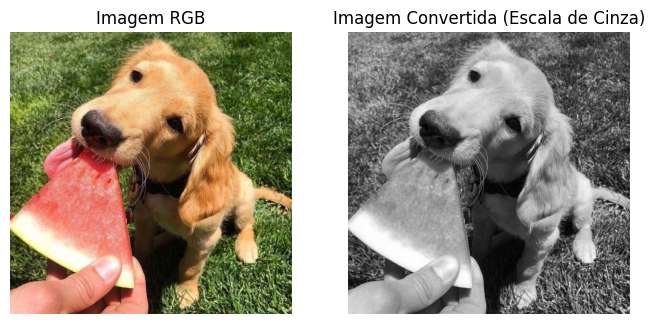

In [108]:
# Conversão de RGB para Escala de Cinza
gray_image = cv2.cvtColor(rgb_image, cv2.COLOR_RGB2GRAY)

# Plota a imagem RGB x a imagem em Escala de Cinza
plot_2_images(rgb_image, gray_image, "Imagem RGB", "Imagem Convertida (Escala de Cinza)", second_is_gray=True)

### Transformações em Escala de Cinza

In [109]:
# Lê a imagem de referência na Escala de Cinza
bgr_image = cv2.imread(image_path)
gray_image = cv2.cvtColor(bgr_image, cv2.COLOR_BGR2GRAY)

- Gamma

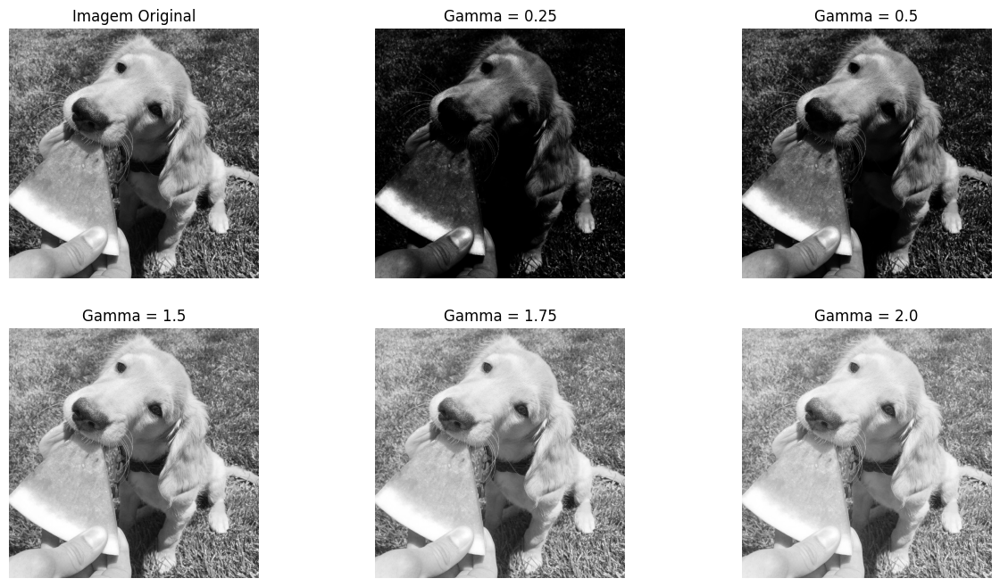

In [110]:
import math

transformed_images = [gray_image]

titles = ["Imagem Original"]

gamma_levels = [0.25, 0.5, 1.5, 1.75, 2.0]

for gamma in gamma_levels:

  # Geração da imagem
  transformed_image = ((gray_image / 255) ** (1.0 / gamma)) * 255
  transformed_images.append(transformed_image)

  # Definição do título
  title = "Gamma = {}".format(gamma)
  titles.append(title)

# Definições do plot
plt.rcParams['figure.figsize'] = [15, 8]
figure, axes = plt.subplots(2, 3)

# Plota todas as imagens geradas
for index in range(len(transformed_images)):

  # Calcula a posição da imagem no plot
  row = math.floor(index / 3)
  col = index % 3

  # Ajusta as informações de cada subplot
  axes[row, col].imshow(transformed_images[index], cmap=plt.cm.gray)
  axes[row, col].axis('off')
  axes[row, col].set_title(titles[index])

plt.show()

- Imagens Negativas

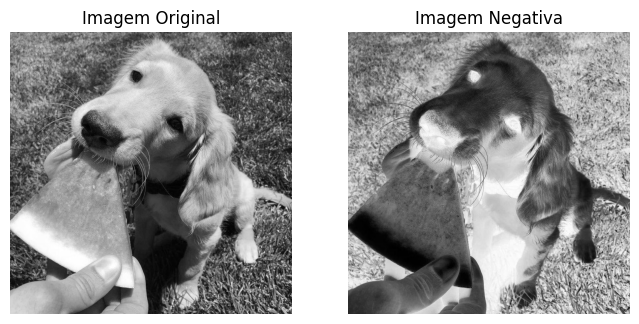

In [111]:
# Inverte a imagem (negativa)
negative_image = cv2.bitwise_not(gray_image)

# Plota a imagem em Escala de Cinza x a imagem Negativa
plot_2_images(gray_image, negative_image, "Imagem Original", "Imagem Negativa", first_is_gray=True, second_is_gray=True)

- Identidade

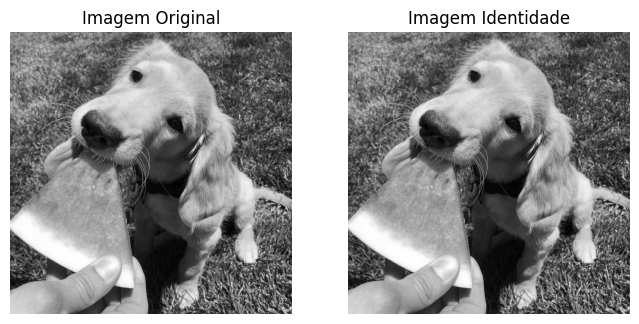

In [112]:
import numpy as np

# # Define a matriz de identidade
identity_matrix = np.float32([[1, 0, 0], [0, 1, 0], [0, 0, 1]])

# Aplica a transformação na imagem
img_identidade = cv2.warpPerspective(gray_image, identity_matrix, (gray_image.shape[1], gray_image.shape[0]))

# Plota a imagem em Escala de Cinza x a imagem da transformação identidade (iguais)
plot_2_images(gray_image, img_identidade, "Imagem Original", "Imagem Identidade", first_is_gray=True, second_is_gray=True)

- Transformações Logarítmicas

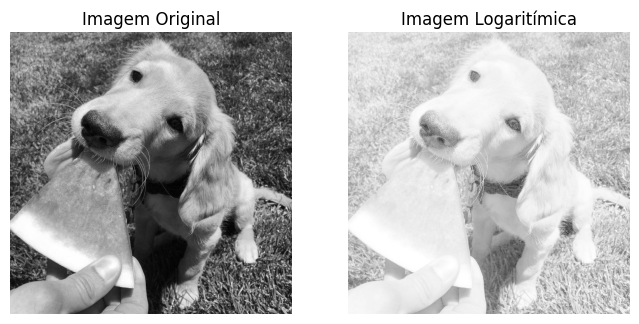

In [113]:
# Calcula o valor de c para essa imagem
c = 255 / np.log(np.max(gray_image) + 1)

# Aplica a transformação sobre a imagem
log_image = c * np.log(gray_image + 1.0)

plot_2_images(gray_image, log_image, "Imagem Original", "Imagem Logaritímica", first_is_gray=True, second_is_gray=True)

- Transformações Lineares

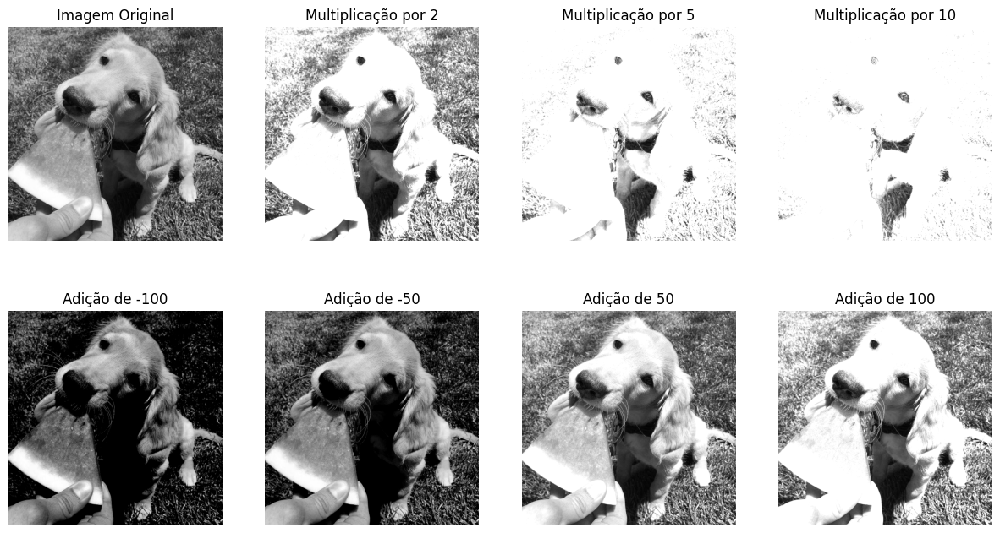

In [114]:
import math

# Cria uma lista de imagens a serem plotadas, inciando com a imagem original
transformed_images = [gray_image]

# Cria uma lista de títulos
titles = ["Imagem Original"]

# Define os fatores multiplicativos e aditivos de cada exemplo
mult_factors = [2, 5, 10]
add_factors = [-100, -50, 50, 100]

# Gera as imagens multiplicadas pelos fatores definidos
for mult_const in mult_factors:

  # Geração da imagem
  transformed_image = np.clip(gray_image.astype(np.float32) * mult_const, 0, 255)
  transformed_images.append(transformed_image)

  # Definição do título
  title = "Multiplicação por {}".format(mult_const)
  titles.append(title)

# Gera as imagens somados aos fatores definidos
for add_const in add_factors:

  # Geração da imagem
  transformed_image = np.clip(gray_image.astype(np.float32) + add_const, 0, 255)
  transformed_images.append(transformed_image)

  # Definição do título
  title = "Adição de {}".format(add_const)
  titles.append(title)
# ------------------------------------------------------------------------------------------------

# Definições do plot
plt.rcParams['figure.figsize'] = [15, 8]
figure, axes = plt.subplots(2, 4)

# Plota todas as imagens geradas
for index in range(len(transformed_images)):

  # Calcula a posição da imagem no plot
  row = math.floor(index / 4)
  col = index % 4

  # Ajusta as informações de cada subplot
  axes[row, col].imshow(transformed_images[index], cmap=plt.cm.gray)
  axes[row, col].axis('off')
  axes[row, col].set_title(titles[index])

plt.show()

- Transformada de Fourier

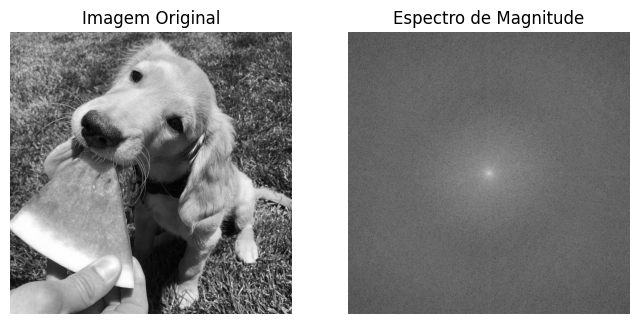

In [115]:
# Aplica a transformação de frequência, onde o componente de frequência zero estará centrado no canto superior esquerdo
frequency_transform = np.fft.fft2(gray_image)

# Desloca o resultado para o centro
fshift = np.fft.fftshift(frequency_transform)

# Encontra a magnitude do espectro
magnitude_spectrum = 20*np.log(np.abs(fshift))

# Plota a imagem em Escala de Cinza e o Espectro de Magnitude resultante da aplicação da Transformada de Fourier
plot_2_images(gray_image, magnitude_spectrum, "Imagem Original", "Espectro de Magnitude", first_is_gray=True, second_is_gray=True)

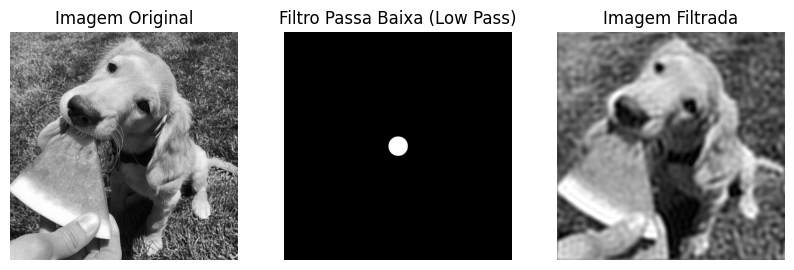

In [116]:
## Filtro de Passa Baixa (Low Pass)
# Define a imagem de entrada
img = cv2.imread("/content/trabalho-paralelo-master/img/dogemelancia.jpeg", 0)

# Aplica a Transformada de Fourier
dft = np.fft.fft2(img, axes=(0,1))

# Desloca o origem para o centro da imagem
dft_shift = np.fft.fftshift(dft)

# Cria uma máscara circular
radius = 32
mask = np.zeros_like(img)
cy = mask.shape[0] // 2
cx = mask.shape[1] // 2
cv2.circle(mask, (cx,cy), radius, (255,255,255), -1)[0]

# Aplica a máscara na transformada deslocada
dft_shift_masked = np.multiply(dft_shift,mask) / 255

# Desloca a origem do centro para o canto superior esquerdo
back_ishift = np.fft.ifftshift(dft_shift)
back_ishift_masked = np.fft.ifftshift(dft_shift_masked)

# Aplica a Transformada de Forier inversa
img_back = np.fft.ifft2(back_ishift, axes=(0,1))
img_filtered = np.fft.ifft2(back_ishift_masked, axes=(0,1))

# Combina os componentes reais e imaginários complexos para formar a imagem original novamente
img_back = np.abs(img_back).clip(0,255).astype(np.uint8)
img_filtered = np.abs(img_filtered).clip(0,255).astype(np.uint8)
# ---------------------------------------------------------------------------------------------------------

# Definições do plot
plt.rcParams['figure.figsize'] = [10, 8]
figure, axes = plt.subplots(1, 3)

## Ajusta as informações de cada subplot
# Imagem Original
axes[0].imshow(img, cmap=plt.cm.gray)
axes[0].axis('off')
axes[0].set_title("Imagem Original")

# Filtro de Passa Baixa
axes[1].imshow(mask, cmap=plt.cm.gray)
axes[1].axis('off')
axes[1].set_title("Filtro Passa Baixa (Low Pass)")

# Resultado da filtragem das frequências altas
axes[2].imshow(img_filtered, cmap=plt.cm.gray)
axes[2].axis('off')
axes[2].set_title("Imagem Filtrada")

plt.show()
# ---------------------------------------------------------------------------------------------------------

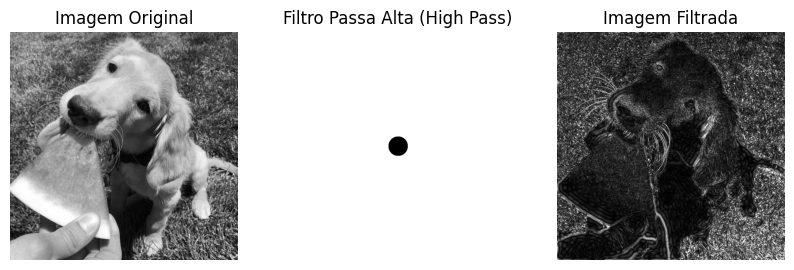

In [117]:
## Filtro de Passa Alta (High Pass)
# Define a imagem de entrada
img = cv2.imread("/content/trabalho-paralelo-master/img/dogemelancia.jpeg", 0)

# Aplica a Transformada de Fourier
dft = np.fft.fft2(img, axes=(0,1))

# Desloca o origem para o centro da imagem
dft_shift = np.fft.fftshift(dft)

# create white circle mask on black background and invert so black circle on white background
# Cria uma máscara circular em um fundo preto e inverte (círculo preto em um fundo branco)
radius = 32
mask = np.zeros_like(img)
cy = mask.shape[0] // 2
cx = mask.shape[1] // 2
cv2.circle(mask, (cx,cy), radius, (255,255,255), -1)[0]
mask = 255 - mask

# Aplica a máscara na transformada deslocada
dft_shift_masked = np.multiply(dft_shift,mask) / 255

# Desloca a origem do centro para o canto superior esquerdo
back_ishift = np.fft.ifftshift(dft_shift)
back_ishift_masked = np.fft.ifftshift(dft_shift_masked)

# Aplica a Transformada de Forier inversa
img_back = np.fft.ifft2(back_ishift, axes=(0,1))
img_filtered = np.fft.ifft2(back_ishift_masked, axes=(0,1))

# Combina os componentes reais e imaginários complexos para formar a imagem original novamente
# Multiplica por 3 para aumentar o brilho
img_back = np.abs(img_back).clip(0,255).astype(np.uint8)
img_filtered = np.abs(3*img_filtered).clip(0,255).astype(np.uint8)
# ---------------------------------------------------------------------------------------------------------

# Definições do plot
plt.rcParams['figure.figsize'] = [10, 8]
figure, axes = plt.subplots(1, 3)

## Ajusta as informações de cada subplot
# Imagem Original
axes[0].imshow(img, cmap=plt.cm.gray)
axes[0].axis('off')
axes[0].set_title("Imagem Original")

# Filtro de Passa Alta
axes[1].imshow(mask, cmap=plt.cm.gray)
axes[1].axis('off')
axes[1].set_title("Filtro Passa Alta (High Pass)")

# Resultado da filtragem das frequências baixas
axes[2].imshow(img_filtered, cmap=plt.cm.gray)
axes[2].axis('off')
axes[2].set_title("Imagem Filtrada")

plt.show()
# ---------------------------------------------------------------------------------------------------------


- Bit Plane Slicing

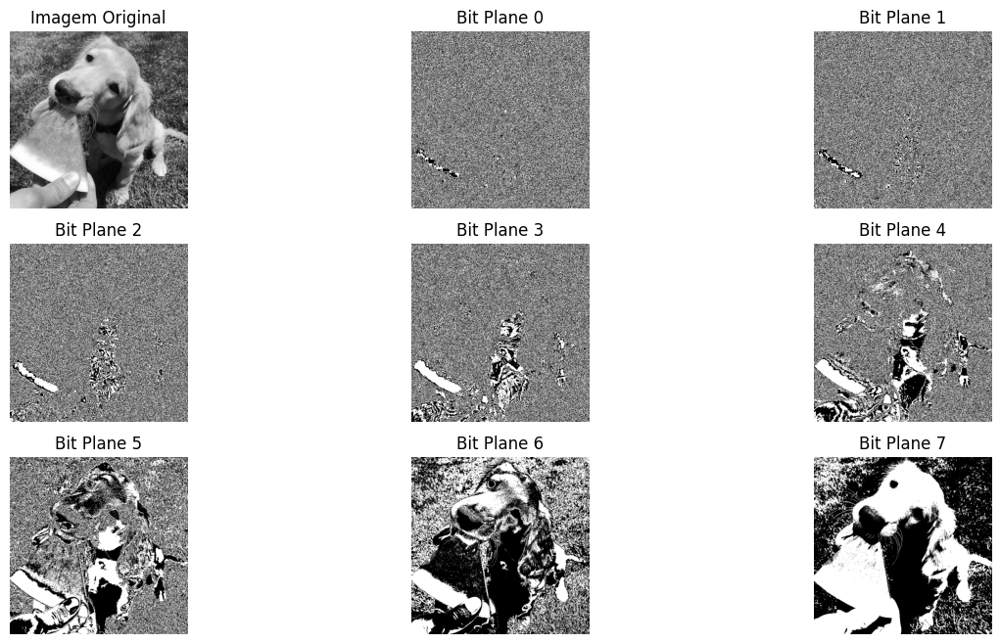

In [118]:

planes = [gray_image]
titles = ["Imagem Original"]

# Separa cada plano de bits
for i in range(8):
    plane = cv2.bitwise_and(gray_image, 1 << i)
    planes.append(plane)
    # Define o título
    title = "Bit Plane {}".format(i)
    titles.append(title)

# Definições do plot
plt.rcParams['figure.figsize'] = [15, 8]
figure, axes = plt.subplots(3, 3)

# Plota todas as imagens geradas
for index in range(len(planes)):

  # Calcula a posição da imagem no plot
  row = math.floor(index / 3)
  col = index % 3

  # Ajusta as informações de cada subplot
  axes[row, col].imshow(planes[index], cmap=plt.cm.gray)
  axes[row, col].axis('off')
  axes[row, col].set_title(titles[index])
# ---------------------------------------------------------------------------------------------------------


Teste com outra imagem de referência

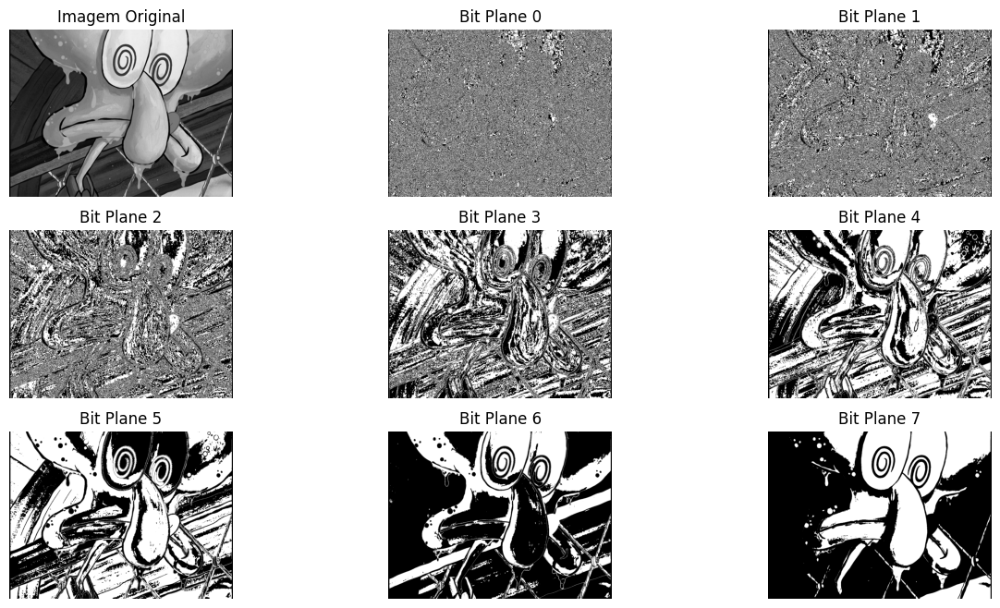

In [119]:
# Define uma imagem de referência
clam_squid = cv2.imread("/content/trabalho-paralelo-master/img/lulamolusco2.jpg", 0)

planes = [clam_squid]
titles = ["Imagem Original"]

# Separa cada plano de bits
for i in range(8):
    plane = cv2.bitwise_and(clam_squid, 1 << i)
    planes.append(plane)
    # Define o título
    title = "Bit Plane {}".format(i)
    titles.append(title)

# Definições do plot
plt.rcParams['figure.figsize'] = [15, 8]
figure, axes = plt.subplots(3, 3)

# Plota todas as imagens geradas
for index in range(len(planes)):

  # Calcula a posição da imagem no plot
  row = math.floor(index / 3)
  col = index % 3

  # Ajusta as informações de cada subplot
  axes[row, col].imshow(planes[index], cmap=plt.cm.gray)
  axes[row, col].axis('off')
  axes[row, col].set_title(titles[index])
  # ---------------------------------------------------------------------------------------------------------

### Threshold

In [120]:
# Define uma imagem de referência
dog_image = gray_image.copy()
gray_image = cv2.imread("/content/trabalho-paralelo-master/img/lisa.jpeg", 0)

- Threshold Global

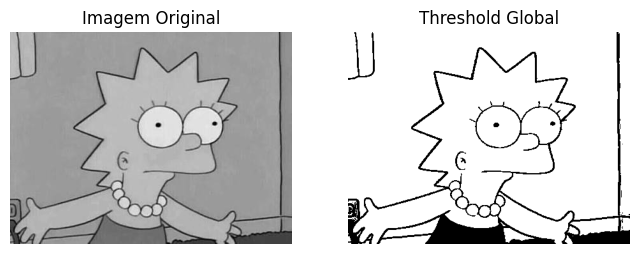

In [121]:
# Seta valor constante para o threshoud
threshold = 127

# Aplica o threshoud constante à todos o pixeis da imagem
(_, global_threshold) = cv2.threshold(gray_image, threshold, 255, cv2.THRESH_BINARY)

# Plota a imagem original x a imagem com threshold global
plot_2_images(gray_image, global_threshold, "Imagem Original", "Threshold Global", first_is_gray=True, second_is_gray=True)

- Threshold Local ou Adaptativo

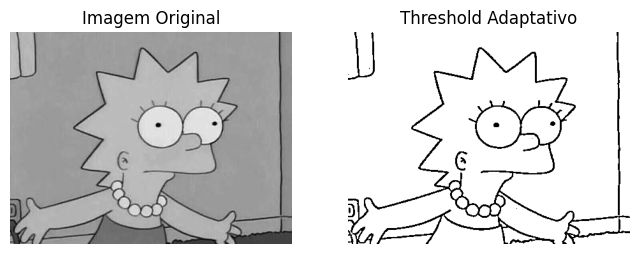

In [122]:
# Aplica o threshold adaptativo com tamanho de bloco de 11 e C sendo 11
adaptive_threshold = cv2.adaptiveThreshold(gray_image, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 11)

# Plota a imagem original x a imagem com threshold adaptativo
plot_2_images(gray_image, adaptive_threshold, "Imagem Original", "Threshold Adaptativo", first_is_gray=True, second_is_gray=True)

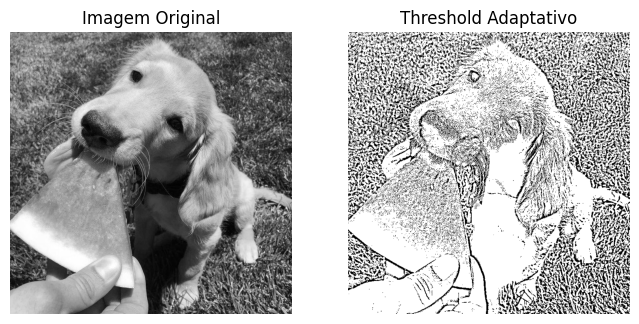

In [123]:
# Aplica o threshold adaptativo com tamanho de bloco de 11 e C sendo 11
adaptive_threshold = cv2.adaptiveThreshold(dog_image, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 11)

# Plota a imagem original x a imagem com threshold adaptativo
plot_2_images(dog_image, adaptive_threshold, "Imagem Original", "Threshold Adaptativo", first_is_gray=True, second_is_gray=True)

- Threshold Automático (Otsu)

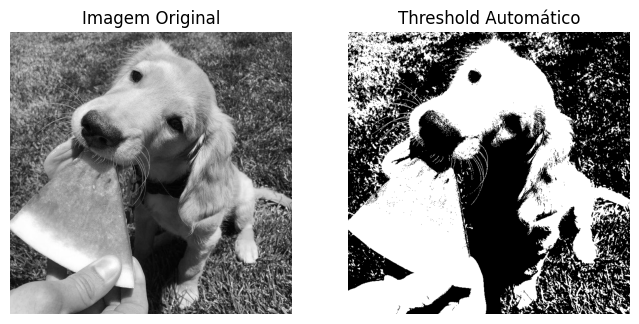

In [124]:
# Aplica o threshoud Automatico
(_, otsu_threshold) = cv2.threshold(dog_image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# Plota a imagem original x a imagem com threshold global
plot_2_images(dog_image, otsu_threshold, "Imagem Original", "Threshold Automático", first_is_gray=True, second_is_gray=True)

- Threshold com dois limites

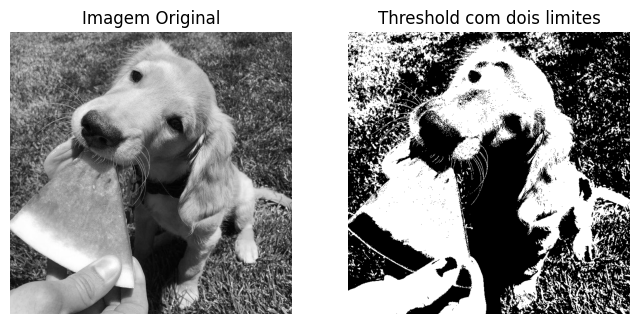

In [125]:
# Define os limites
limiar1 = 115
limiar2 = 225

# Aplica o primeiro threshold
_, threshold1 = cv2.threshold(dog_image, limiar1, 255, cv2.THRESH_BINARY)

# Aplica o segundo threshold
_, threshold2 = cv2.threshold(dog_image, limiar2, 255, cv2.THRESH_BINARY_INV)

# Combina os dois resultados
two_threshold = cv2.bitwise_and(threshold1, threshold2)

# Plota a imagem original x imagem com dois limites de threshoud aplicados
plot_2_images(dog_image, two_threshold, "Imagem Original", "Threshold com dois limites", first_is_gray=True, second_is_gray=True)


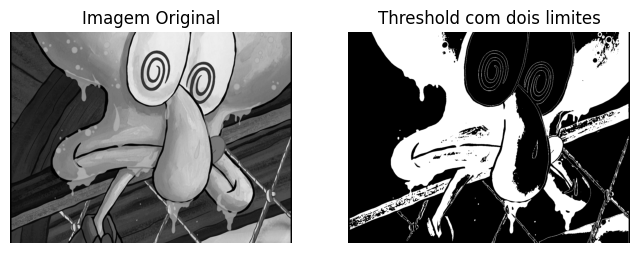

In [126]:
# Define os limites
limiar1 = 85
limiar2 = 165

# Aplica o threshold usando cv2.inRange()
two_threshold = cv2.inRange(clam_squid, limiar1, limiar2)

# Plota a imagem original x imagem com dois limites de threshold aplicados
plot_2_images(clam_squid, two_threshold, "Imagem Original", "Threshold com dois limites", first_is_gray=True, second_is_gray=True)

### Histograma

In [127]:
# Define uma imagem de referência
gray_image = cv2.imread(image_path, 0)

- Cálculo do Histograma

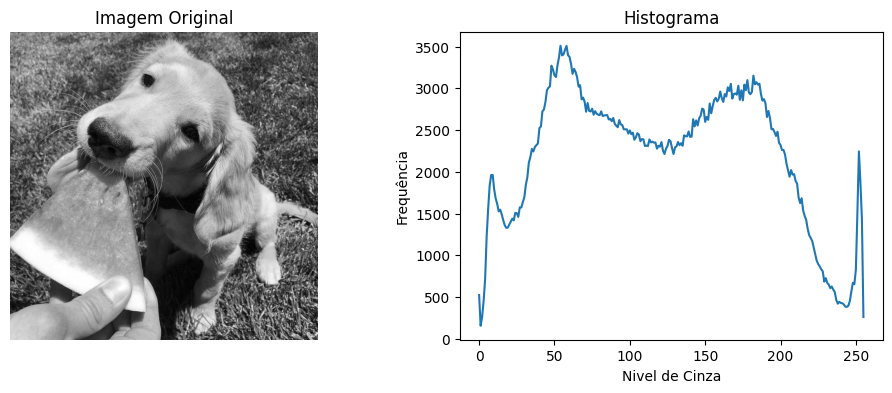

In [128]:
# Cálculo do Histograma
histogram = cv2.calcHist([gray_image], [0], None, [256], [0, 256])
# ------------------------------------------------------------------------------

# Definições do plot
plt.rcParams['figure.figsize'] = [12, 4]
figure, axes = plt.subplots(1, 2)

# Definições do plot da imagem original
axes[0].imshow(gray_image, cmap=plt.cm.gray)
axes[0].axis('off')
axes[0].set_title("Imagem Original")

# Definições do plot do histograma
axes[1].plot(histogram)
axes[1].set_title("Histograma")
axes[1].set_xlabel("Nivel de Cinza")
axes[1].set_ylabel("Frequência")

# Plota as duas imagens lado a lado
plt.show()
# ------------------------------------------------------------------------------

- Histograma Normalizado

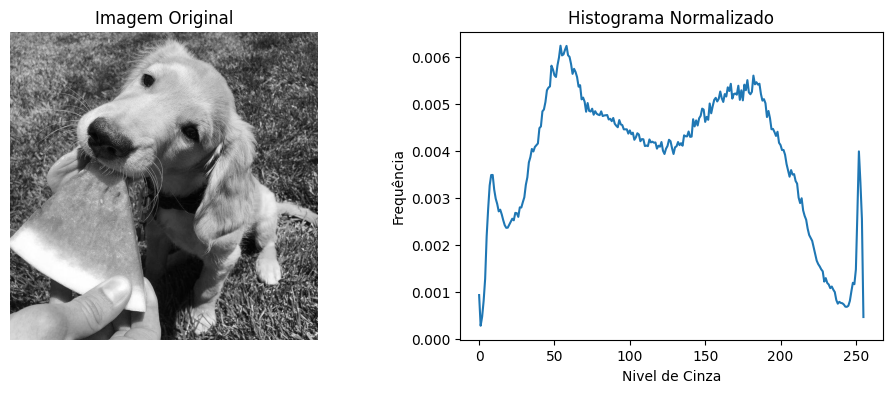

In [129]:
# Cálculo do Histograma
histogram = cv2.calcHist([gray_image], [0], None, [256], [0, 256])

# Normalização do Histograma
histogram /= histogram.sum()
# ------------------------------------------------------------------------------

# Definições do plot
plt.rcParams['figure.figsize'] = [12, 4]
figure, axes = plt.subplots(1, 2)

# Definições do plot da imagem original
axes[0].imshow(gray_image, cmap=plt.cm.gray)
axes[0].axis('off')
axes[0].set_title("Imagem Original")

# Definições do plot do histograma normalizado
axes[1].plot(histogram)
axes[1].set_title("Histograma Normalizado")
axes[1].set_xlabel("Nivel de Cinza")
axes[1].set_ylabel("Frequência")

# Plota as duas imagens lado a lado
plt.show()
# ------------------------------------------------------------------------------


- Equalização de Histograma

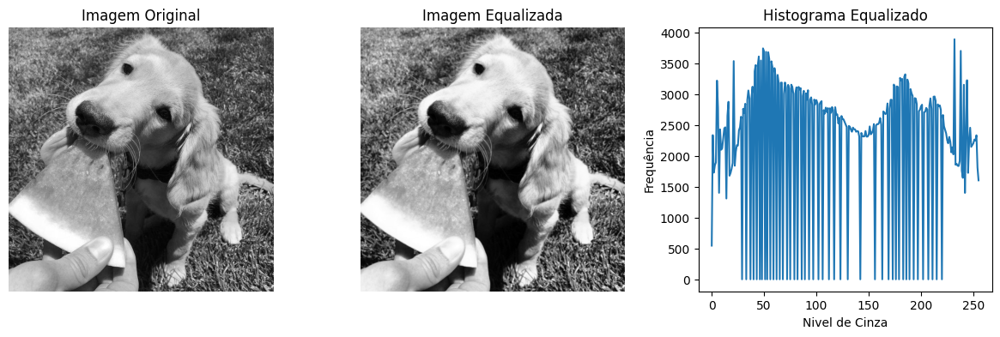

In [130]:
# Aplica filtro gaussiano para redução de ruídos
equalized_image = cv2.GaussianBlur(gray_image, ksize=(3,3),sigmaX=0)

# Aplica função de equalização sobre imagem 
equalized_image = cv2.equalizeHist(equalized_image)

# Cálculo do Histograma
histogram = cv2.calcHist([equalized_image], [0], None, [256], [0, 256])

# Definições do plot
plt.rcParams['figure.figsize'] = [15, 4]
figure, axes = plt.subplots(1, 3)

# Definições do plot da imagem original
axes[0].imshow(gray_image, cmap=plt.cm.gray)
axes[0].axis('off')
axes[0].set_title("Imagem Original")

# Definições do plot da imagem equalizada
axes[1].imshow(equalized_image, cmap=plt.cm.gray)
axes[1].axis('off')
axes[1].set_title("Imagem Equalizada")

# Definições do plot do histograma normalizado
axes[2].plot(histogram)
axes[2].set_title("Histograma Equalizado")
axes[2].set_xlabel("Nivel de Cinza")
axes[2].set_ylabel("Frequência")

# Plota as duas imagens lado a lado
plt.show()
# ------------------------------------------------------------------------------



### Filtros

In [131]:
# Define uma imagem de referência
gray_image = cv2.imread(image_path, 0)

- Borramento

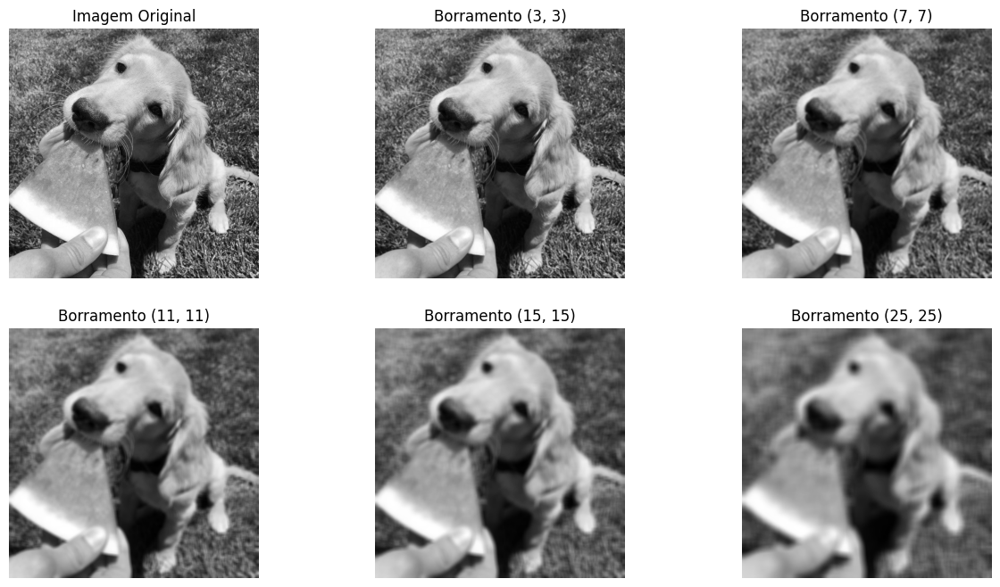

In [132]:
import math

# Define os tamanhos de kernel
kernel_sizes = [(3, 3), (7, 7), (11, 11), (15, 15), (25, 25)]

# Define uma lista com todas as imagens que serão plotadas
blur_images = [gray_image]

# Define uma lista de títulos
titles = ["Imagem Original"]

# Aplica o borramento nas imagens
for kernel_size in kernel_sizes:

  # Aplica o borramento na imagem
  blur_image = cv2.blur(gray_image, kernel_size)
  blur_images.append(blur_image)

  # Define o título
  title = "Borramento {}".format(kernel_size)
  titles.append(title)
# ------------------------------------------------------------------------

# Definições do plot
plt.rcParams['figure.figsize'] = [15, 8]
figure, axes = plt.subplots(2, 3)

# Plota todas as imagens geradas
for index in range(len(blur_images)):

  # Calcula a posição da imagem no plot
  row = math.floor(index / 3)
  col = index % 3

  # Ajusta as informações de cada subplot
  axes[row, col].imshow(blur_images[index], cmap=plt.cm.gray)
  axes[row, col].axis('off')
  axes[row, col].set_title(titles[index])

plt.show()
# ------------------------------------------------------------------------

- Sharpening

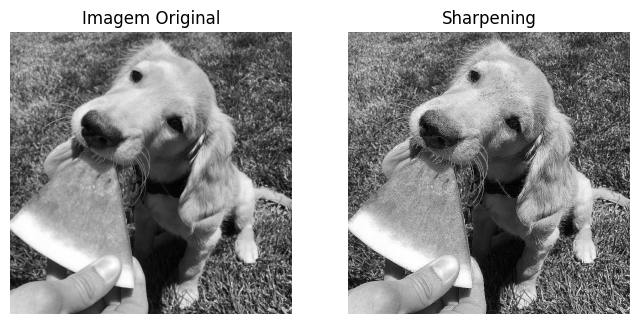

In [133]:
import numpy as np

# Define o kernel
kernel = np.array([[0, -1, 0],
                   [-1, 5,-1],
                   [0, -1, 0]])


# Aplica a técnica de sharpening
sharpen_image = cv2.filter2D(src=gray_image, ddepth=-1, kernel=kernel)

# Plota a imagem original x a imagem resultante da técnica sharpening
plot_2_images(gray_image, sharpen_image, "Imagem Original", "Sharpening", first_is_gray=True, second_is_gray=True)

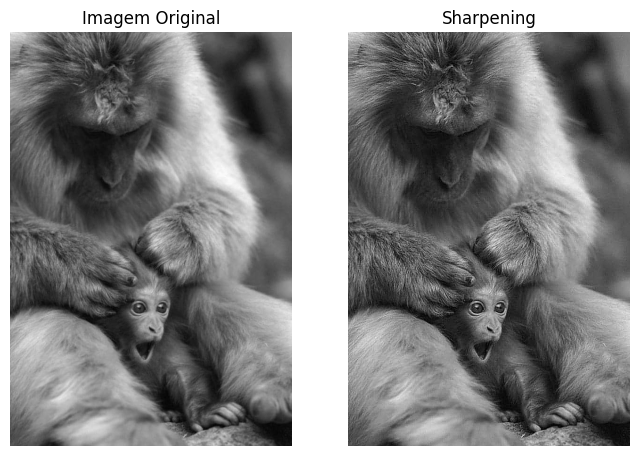

In [134]:
# Outro exemplo
monkey_image = cv2.imread("/content/trabalho-paralelo-master/img/uau.jpeg", 0)

# Aplica a técnica de sharpening
sharpen_image = cv2.filter2D(src=monkey_image, ddepth=-1, kernel=kernel)

# Plota a imagem original x a imagem resultante da técnica sharpening
plot_2_images(monkey_image, sharpen_image, "Imagem Original", "Sharpening", first_is_gray=True, second_is_gray=True)

- Gaussiano

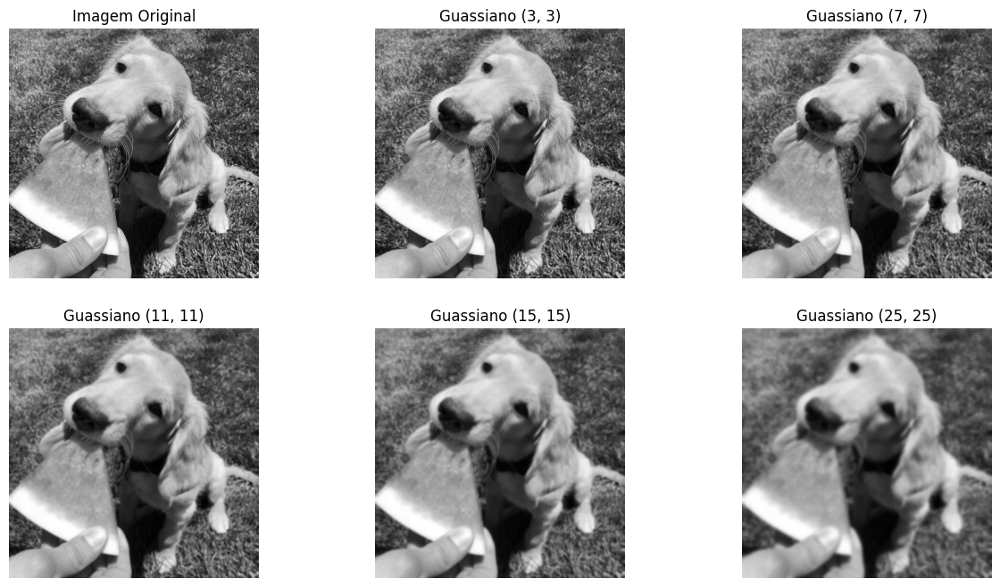

In [135]:
# Define os tamanhos de kernel
kernel_sizes = [(3, 3), (7, 7), (11, 11), (15, 15), (25, 25)]

# Define uma lista com as imagens a serem plotadas
gaussian_images = [gray_image]

# Define uma lista de títulos
titles = ["Imagem Original"]

# Para cada tamanho de kernel 
for kernel_size in kernel_sizes:
  # Aplica filtro Gaussiano e adiciona a lista
  gaussian = cv2.GaussianBlur(gray_image,ksize=kernel_size,sigmaX=0)
  gaussian_images.append(gaussian)
  # Define o título
  title = "Guassiano {}".format(kernel_size)
  titles.append(title)

# Definições do plot
plt.rcParams['figure.figsize'] = [15, 8]
figure, axes = plt.subplots(2, 3)

# Plota todas as imagens geradas
for index in range(len(gaussian_images)):

  # Calcula a posição da imagem no plot
  row = math.floor(index / 3)
  col = index % 3

  # Ajusta as informações de cada subplot
  axes[row, col].imshow(gaussian_images[index], cmap=plt.cm.gray)
  axes[row, col].axis('off')
  axes[row, col].set_title(titles[index])

plt.show()
# ------------------------------------------------------------------------

### Detecção de Bordas

In [136]:
# Define imagens de referência
dog_image = cv2.imread(image_path, 0)
gray_image = cv2.imread("/content/trabalho-paralelo-master/img/lisa.jpeg", 0)

- Laplaciano

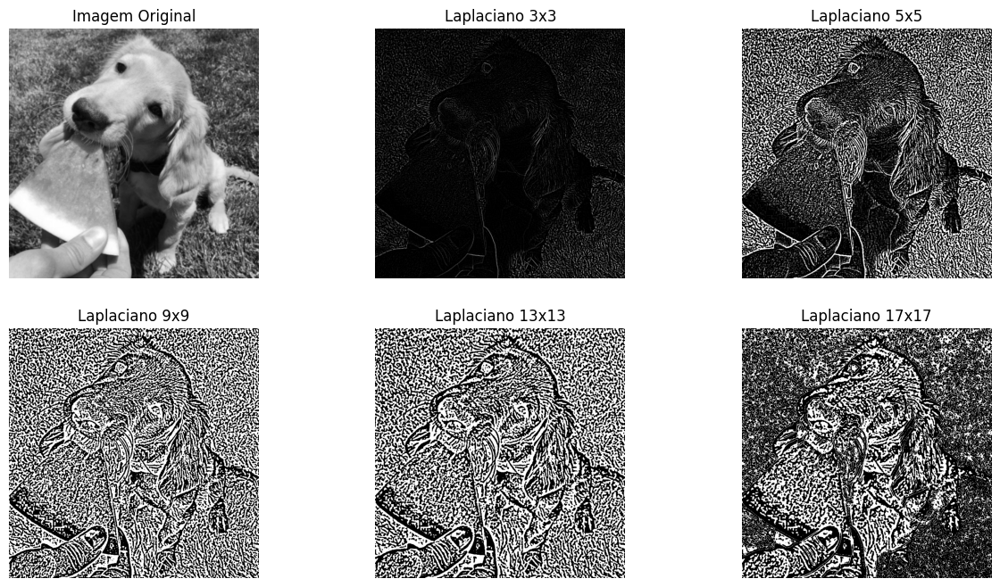

In [137]:
# Define os tamanhos de kernel
kernel_sizes = [ 3, 5, 9, 13, 17]

# Aplicar o filtro gaussiano para reduzir o ruído
blur_image = cv2.GaussianBlur(dog_image, (5,5), 0)

# Define uma lista com as imagens a serem plotadas
laplacian_images = [blur_image]

# Define uma lista de títulos
titles = ["Imagem Original"]

# Para cada tamanho de kernel 
for kernel_size in kernel_sizes:
  # Aplica filtro Laplaciano e adiciona a lista
  laplacian = cv2.Laplacian(blur_image, cv2.CV_8U, ksize=kernel_size)
  laplacian_images.append(laplacian)
  # Define o título
  title = "Laplaciano {}".format(kernel_size) + "x{}".format(kernel_size)
  titles.append(title)

# Definições do plot
plt.rcParams['figure.figsize'] = [15, 8]
figure, axes = plt.subplots(2, 3)

# Plota todas as imagens geradas
for index in range(len(laplacian_images)):

  # Calcula a posição da imagem no plot
  row = math.floor(index / 3)
  col = index % 3

  # Ajusta as informações de cada subplot
  axes[row, col].imshow(laplacian_images[index], cmap=plt.cm.gray)
  axes[row, col].axis('off')
  axes[row, col].set_title(titles[index])

plt.show()
# ------------------------------------------------------------------------

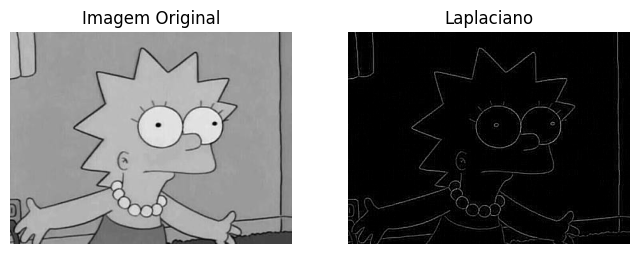

In [138]:
# Aplica filtro laplaciano com kernel=1 para obter as derivadas da imagem
laplacian = cv2.Laplacian(gray_image, cv2.CV_8U )

# Plota a imagem original x image resultante do Sobel
plot_2_images(gray_image, laplacian, "Imagem Original", "Laplaciano", first_is_gray=True, second_is_gray=True)

- Operador Sobel

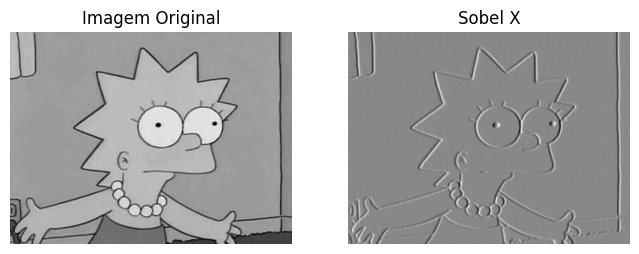

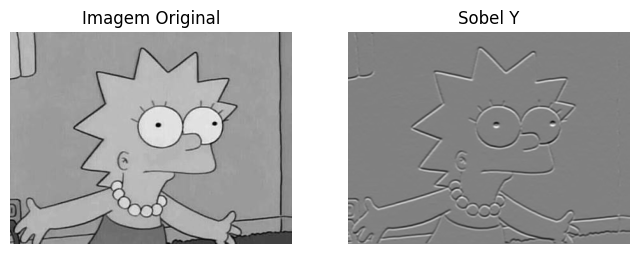

In [139]:
# Calcula as derivadas em X e Y
sobel_x = cv2.Sobel(gray_image, cv2.CV_64F, 1, 0, ksize=5)
sobel_y = cv2.Sobel(gray_image, cv2.CV_64F, 0, 1, ksize=5)

# Plota a imagem original x image resultante do Sobel
plot_2_images(gray_image, sobel_x, "Imagem Original", "Sobel X", first_is_gray=True, second_is_gray=True)
plot_2_images(gray_image, sobel_y, "Imagem Original", "Sobel Y", first_is_gray=True, second_is_gray=True)

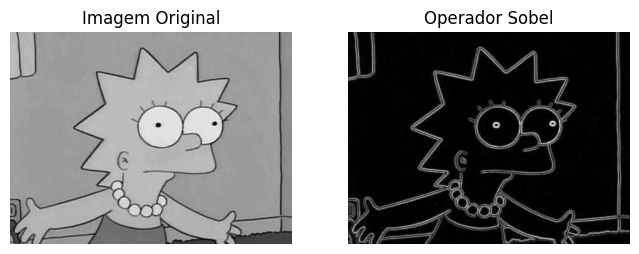

In [140]:
# Para realizar a detecção de bordas com esse operador é preciso normalizá-lo
gradients = np.sqrt(sobel_x**2 + sobel_y**2)
gradients_norm = (gradients * 255 / gradients.max()).astype(np.uint8)

# Plota a imagem original x imagem resultante da normalização
plot_2_images(gray_image, gradients_norm, "Imagem Original", "Operador Sobel", first_is_gray=True, second_is_gray=True)

- Canny

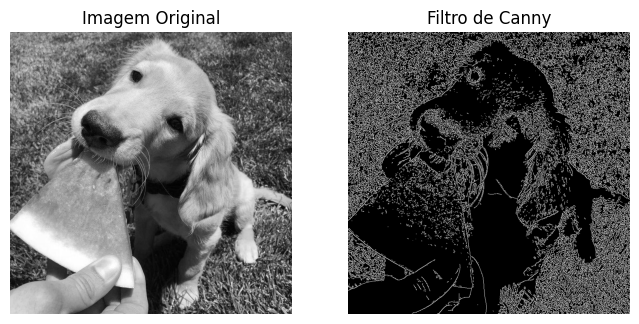

In [141]:
# Aplica filtro Canny para encontrar as bordas
canny_edges = cv2.Canny(dog_image,120,160)

# Plota a imagem original x image resultante do Sobel
plot_2_images(dog_image, canny_edges, "Imagem Original", "Filtro de Canny", first_is_gray=True, second_is_gray=True)

### Seleção de Bordas

- Non-Maximum Suppression

In [142]:
# Define uma imagem de referência
messi_image = cv2.imread("/content/trabalho-paralelo-master/img/messikk.jpg", 0)
lula_molusco = cv2.imread("/content/trabalho-paralelo-master/img/lulamolusco2.jpg", 0)

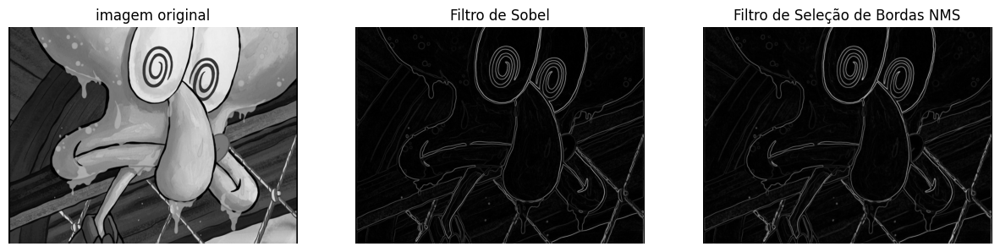

In [143]:
# Lista de imagens a serem plotadas e titulos
NMS_images = [lula_molusco]
titles = ["imagem original"]

# Aplica o filtro Sobel para obter a magnitude do gradiente
grad_x = cv2.Sobel(lula_molusco, cv2.CV_64F, 1, 0, ksize=3)
grad_y = cv2.Sobel(lula_molusco, cv2.CV_64F, 0, 1, ksize=3)
gradient = cv2.magnitude(grad_x, grad_y)

# Adiciona o Gradiente a lista de imagens
NMS_images.append(gradient)
titles.append("Filtro de Sobel")

# Aplica o filtro Non-Maximum Suppression
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3,3))
NMS = cv2.morphologyEx(gradient, cv2.MORPH_CLOSE, kernel)

# Adiciona imagem com filtro NMS a lista de imagens
NMS_images.append(NMS)
titles.append("Filtro de Seleção de Bordas NMS")

# ------------------------------------------------------------------------

# Definições do plot
plt.rcParams['figure.figsize'] = [15, 8]
figure, axes = plt.subplots(1, 3)

# Plota todas as imagens geradas
for index in range(len(NMS_images)):

  # Calcula a posição da imagem no plot
  row = math.floor(index / 3)
  col = index % 3

  # Ajusta as informações de cada subplot
  axes[col].imshow(NMS_images[index], cmap=plt.cm.gray)
  axes[col].axis('off')
  axes[col].set_title(titles[index])

plt.show()
# ------------------------------------------------------------------------

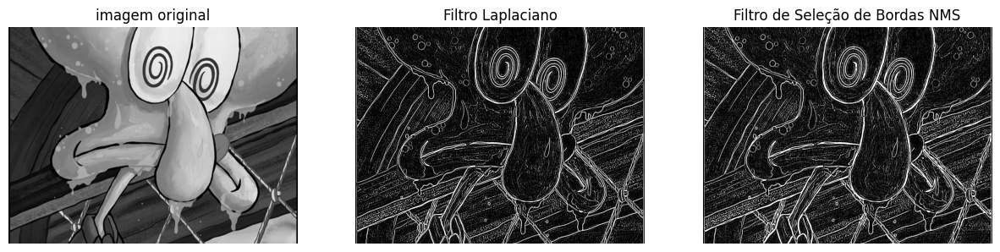

In [144]:
# Lista de imagens a serem plotadas e titulos
NMS_images = [lula_molusco]
titles = ["imagem original"]

# Aplica filtro Laplaciano
laplacian = cv2.Laplacian(lula_molusco, cv2.CV_8U, ksize=5)

# Adiciona o Laplaciano a lista de imagens
NMS_images.append(laplacian)
titles.append("Filtro Laplaciano")

# Aplica o filtro Non-Maximum Suppression
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3,3))
NMS = cv2.morphologyEx(laplacian, cv2.MORPH_CLOSE, kernel)

# Adiciona imagem com filtro NMS a lista de imagens
NMS_images.append(NMS)
titles.append("Filtro de Seleção de Bordas NMS")

# ------------------------------------------------------------------------

# Definições do plot
plt.rcParams['figure.figsize'] = [15, 8]
figure, axes = plt.subplots(1, 3)

# Plota todas as imagens geradas
for index in range(len(NMS_images)):

  # Calcula a posição da imagem no plot
  col = index % 3

  # Ajusta as informações de cada subplot
  axes[col].imshow(NMS_images[index], cmap=plt.cm.gray)
  axes[col].axis('off')
  axes[col].set_title(titles[index])

plt.show()
# ------------------------------------------------------------------------

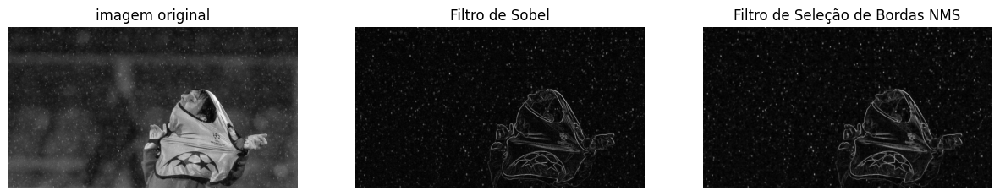

In [145]:
# Lista de imagens a serem plotadas e titulos
NMS_images = [messi_image]
titles = ["imagem original"]

# Aplica o filtro Sobel para obter a magnitude do gradiente
grad_x = cv2.Sobel(messi_image, cv2.CV_64F, 1, 0, ksize=3)
grad_y = cv2.Sobel(messi_image, cv2.CV_64F, 0, 1, ksize=3)
gradient = cv2.magnitude(grad_x, grad_y)

# Adiciona o Gradiente a lista de imagens
NMS_images.append(gradient)
titles.append("Filtro de Sobel")

# Aplica o filtro Non-Maximum Suppression
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3,3))
NMS = cv2.morphologyEx(gradient, cv2.MORPH_CLOSE, kernel)

# Adiciona imagem com filtro NMS a lista de imagens
NMS_images.append(NMS)
titles.append("Filtro de Seleção de Bordas NMS")

# ------------------------------------------------------------------------

# Definições do plot
plt.rcParams['figure.figsize'] = [15, 8]
figure, axes = plt.subplots(1, 3)

# Plota todas as imagens geradas
for index in range(len(NMS_images)):

  # Calcula a posição da imagem no plot
  row = math.floor(index / 3)
  col = index % 3

  # Ajusta as informações de cada subplot
  axes[col].imshow(NMS_images[index], cmap=plt.cm.gray)
  axes[col].axis('off')
  axes[col].set_title(titles[index])

plt.show()
# ------------------------------------------------------------------------

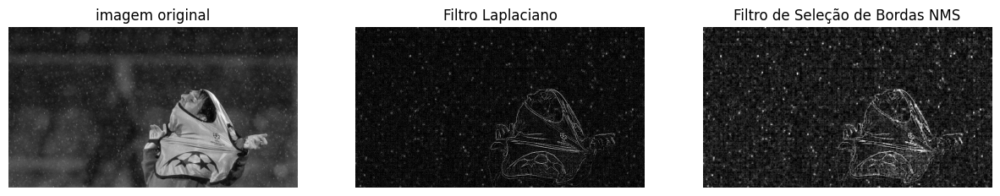

In [146]:
# Lista de imagens a serem plotadas e titulos
NMS_images = [messi_image]
titles = ["imagem original"]

# Aplica filtro Laplaciano
laplacian = cv2.Laplacian(messi_image, cv2.CV_8U, ksize=3)

# Adiciona o Laplaciano a lista de imagens
NMS_images.append(laplacian)
titles.append("Filtro Laplaciano")

# Aplica o filtro Non-Maximum Suppression
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3,3))
NMS = cv2.morphologyEx(laplacian, cv2.MORPH_CLOSE, kernel)

# Adiciona imagem com filtro NMS a lista de imagens
NMS_images.append(NMS)
titles.append("Filtro de Seleção de Bordas NMS")

# ------------------------------------------------------------------------

# Definições do plot
plt.rcParams['figure.figsize'] = [15, 8]
figure, axes = plt.subplots(1, 3)

# Plota todas as imagens geradas
for index in range(len(NMS_images)):

  # Calcula a posição da imagem no plot
  col = index % 3

  # Ajusta as informações de cada subplot
  axes[col].imshow(NMS_images[index], cmap=plt.cm.gray)
  axes[col].axis('off')
  axes[col].set_title(titles[index])

plt.show()
# ------------------------------------------------------------------------


Teste com outra imagem

In [147]:
# Define uma imagem de referência
messi_image = cv2.imread("/content/trabalho-paralelo-master/img/messikk.jpg", 0)

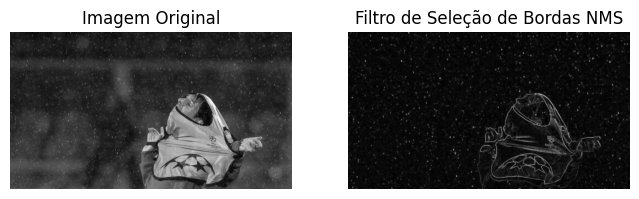

In [148]:
# Aplica o filtro Sobel para obter a magnitude do gradiente
grad_x = cv2.Sobel(messi_image, cv2.CV_64F, 1, 0, ksize=3)
grad_y = cv2.Sobel(messi_image, cv2.CV_64F, 0, 1, ksize=3)
gradient = cv2.magnitude(grad_x, grad_y)

# Aplica o filtro Non-Maximum Suppression
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3,3))
NMS = cv2.morphologyEx(gradient, cv2.MORPH_CLOSE, kernel)

# Plota a imagem original x image resultante do Sobel
plot_2_images(messi_image, NMS, "Imagem Original", "Filtro de Seleção de Bordas NMS", first_is_gray=True, second_is_gray=True)

### Resampling

In [149]:
# Define uma imagem de referência
gray_image = cv2.imread(image_path, 0)

- Upsampling

Tamanho da Imagem:
  - Antes do Upsampling: (750, 750)
  - Depois do Upsampling: (1500, 1500)



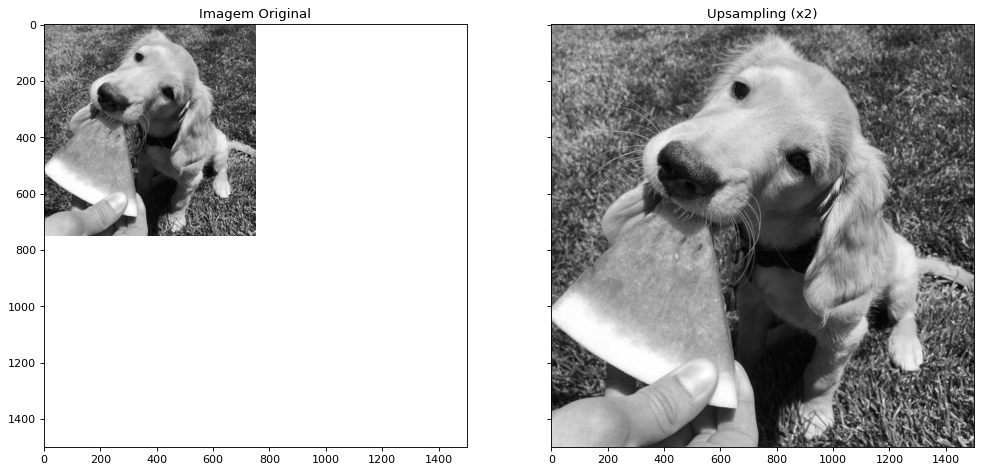

In [150]:
# Com Pirâmides Gaussianas
upsampling_image = cv2.pyrUp(gray_image)

print("Tamanho da Imagem:")
print("  - Antes do Upsampling: {}".format(gray_image.shape))
print("  - Depois do Upsampling: {}\n".format(upsampling_image.shape))
# -----------------------------------------------------------------------------------------------------

# Definições do Plot
figure, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 7), dpi=80, sharex=True, sharey=True)

# Imagem Original (menor)
axes[0].imshow(gray_image, cmap='gray')
axes[0].set_title("Imagem Original")

# Imagem após o Upsampling (maior)
axes[1].imshow(upsampling_image, cmap='gray')
axes[1].set_title("Upsampling (x2)")
plt.show()
# -----------------------------------------------------------------------------------------------------

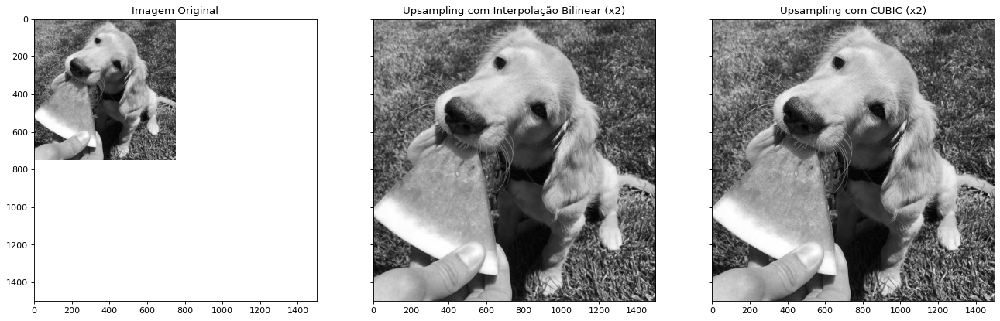

In [151]:
# Com resize

# Define a porcentagem que deseja aumentar
scale_percent = 100 

# Calcula as novas dimensões
width = gray_image.shape[1] + int(gray_image.shape[1] * scale_percent / 100)
height = gray_image.shape[0] + int(gray_image.shape[0] * scale_percent / 100)

# Aplica o resize (método de Interpolação Bilinear)
resized_image_bilinear = cv2.resize(gray_image, (width, height), interpolation = cv2.INTER_LINEAR)

# Aplica o resize (método CUBIC)
resized_image_cubic = cv2.resize(gray_image, (width, height), interpolation = cv2.INTER_CUBIC)
# ------------------------------------------------------------------------------------------------------

# Definições do Plot
figure, axes = plt.subplots(nrows=1, ncols=3, figsize=(20, 7), dpi=80, sharex=True, sharey=True)

# Imagem Original
axes[0].imshow(gray_image, cmap='gray')
axes[0].set_title("Imagem Original")

# Imagem após o Upsampling com Interpolação Bilinear
axes[1].imshow(resized_image_bilinear, cmap='gray')
axes[1].set_title("Upsampling com Interpolação Bilinear (x2)")

# Imagem após o Upsampling com o método CUBIC
axes[2].imshow(resized_image_cubic, cmap='gray')
axes[2].set_title("Upsampling com CUBIC (x2)")
plt.show()
# ------------------------------------------------------------------------------------------------------

- Downsampling

Tamanho da Imagem:
  - Antes do Downsampling: (750, 750)
  - Depois do Downsampling: (375, 375)



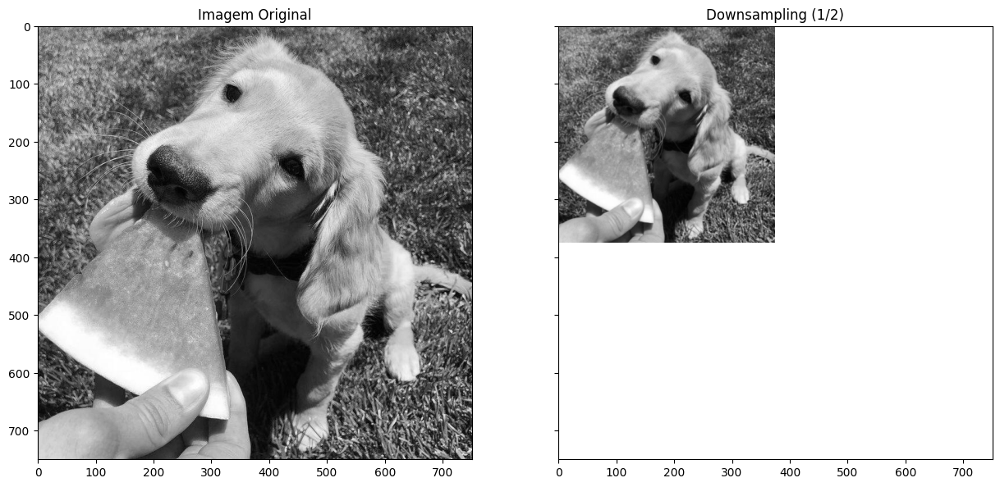

In [152]:
# Com Pirâmides Gaussianas
downsampling_image = cv2.pyrDown(gray_image)

print("Tamanho da Imagem:")
print("  - Antes do Downsampling: {}".format(gray_image.shape))
print("  - Depois do Downsampling: {}\n".format(downsampling_image.shape))
# -----------------------------------------------------------------------------------------------------

# Definições do Plot
figure, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 7), sharex=True, sharey=True)

# Imagem Original (menor)
axes[0].imshow(gray_image, cmap='gray')
axes[0].set_title("Imagem Original")
# Seta a proporção do primeiro plot com as proporções da maior imagem
axes[0].set_xlim([0, gray_image.shape[1]])
axes[0].set_ylim([gray_image.shape[0], 0])

# Imagem após o Upsampling (maior)
axes[1].imshow(downsampling_image, cmap='gray')
axes[1].set_title("Downsampling (1/2)")
plt.show()
# -----------------------------------------------------------------------------------------------------

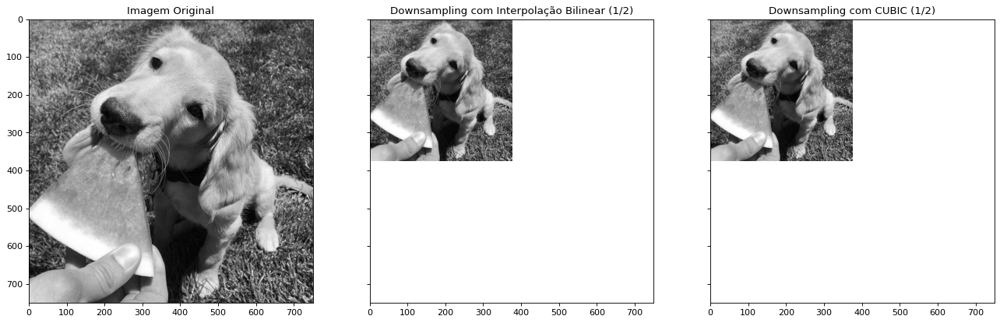

In [153]:
# Com resize

# Define a porcentagem que deseja aumentar
scale_percent = 50 

# Calcula as novas dimensões
width = gray_image.shape[1] - int(gray_image.shape[1] * scale_percent / 100)
height = gray_image.shape[0] - int(gray_image.shape[0] * scale_percent / 100)

# Aplica o resize (método de Interpolação Bilinear)
resized_image_bilinear = cv2.resize(gray_image, (width, height), interpolation = cv2.INTER_LINEAR)

# Aplica o resize (método CUBIC)
resized_image_cubic = cv2.resize(gray_image, (width, height), interpolation = cv2.INTER_CUBIC)
# ------------------------------------------------------------------------------------------------------

# Definições do Plot
figure, axes = plt.subplots(nrows=1, ncols=3, figsize=(20, 7), dpi=80, sharex=True, sharey=True)

# Imagem Original
axes[0].imshow(gray_image, cmap='gray')
axes[0].set_title("Imagem Original")
# Seta a proporção do primeiro plot com as proporções da maior imagem
axes[0].set_xlim([0, gray_image.shape[1]])
axes[0].set_ylim([gray_image.shape[0], 0])

# Imagem após o Downsampling com Interpolação Bilinear
axes[1].imshow(resized_image_bilinear, cmap='gray')
axes[1].set_title("Downsampling com Interpolação Bilinear (1/2)")

# Imagem após o Downsampling com o método CUBIC
axes[2].imshow(resized_image_cubic, cmap='gray')
axes[2].set_title("Downsampling com CUBIC (1/2)")
plt.show()
# ------------------------------------------------------------------------------------------------------

### Especificação

**Técnicas das Aulas:**

- Tipos de Imagem (leitura, plot e conversão):
  - Escala de Cinza ✅ | **Glenda**
  - Imagens RGB ✅ | **Glenda**

- Transformações em Escala de Cinza:
  - Gamma ✅ | **Jhoser**
  - Imagens Negativas ✅ | **Glenda**
  - Identidade ✅ | **Glenda**
  - Transformações Logarítmicas ✅ | **Jhoser**
  - Transformada de Fourier ✅ | **Glenda**
  - Transformações Lineares ✅ | **Glenda**
  - Bit Plane Slicing ✅ | **Jhoser**

- Threshold:
  - Global ✅️ | **Jhoser**
  - Local ou Adaptativo ✅ | **Glenda**
  - Automático ✅️ | **Jhoser**
  - Com dois limites ✅ | **Jhoser**

- Histograma:
  - Cálculo do Histograma ✅ | **Glenda**
  - Histograma Normalizado ✅ | **Glenda**
  - Equalização de Histograma ✅ | **Jhoser**

- Filtros:
  - Borramento ✅ | **Glenda**
  - Sharpening ✅ | **Glenda**
  - Gaussiano ✅ | **Jhoser**

- Detecção de Bordas:
  - Laplaciano ✅ | **Jhoser**
  - Operador Sobel ✅ | **Glenda**
  - Canny ✅ | **Jhoser**

- Seleção da borda:
  - Non-Maximum Suppression ✅ | **Jhoser**

- Resolução:
  - Upsampling ✅ | **Glenda**
  - Downsampling ✅ | **Jhoser**

**Especificação**

- Exercício com fundamentos de processamento de imagens e filtros.

- Instalar o jupyter lab para realizar exercícios interativos em python e opencv.

- Em duplas implementar um workflow que exercite a maior parte do conteúdo visto em aula a respeito de threshold, filtros e detecção de curvas. 

- **Proponha uma aplicação para isto que você está fazendo.**

- Faça upload de uma descrição breve do que você fez, **mostrando imagens de entrada e saída**, em formato de **relatório sucinto** em pdf.

- Indique também o link para o **repositório do git**.